In [ ]:
!pip install pandas
import pandas as pd

In [ ]:
data = pd.read_csv("/content/cybersecurity_intrusion_data.csv") #read csv file
display(data.head())

,session_id,network_packet_size,protocol_type,login_attempts,session_duration,encryption_used,ip_reputation_score,failed_logins,browser_type,unusual_time_access,attack_detected
0,SID_00001,599,NaN,4,492.983263,DES,0.606818,1,Edge,0,1
1,SID_00002,472,TCP,3,1557.996461,DES,0.301569,0,Firefox,0,0
2,SID_00003,629,TCP,3,75.044262,DES,0.739164,2,Chrome,0,1
3,SID_00004,804,NaN,4,601.248835,DES,0.123267,0,Unknown,0,1
4,SID_00005,453,TCP,5,532.540888,AES,0.054874,1,Firefox,0,0


# Understanding Data

In [ ]:
print(data.shape) #shape gives number of rows and columns of data

(9537, 11)


In [ ]:
pd.set_option('display.max_columns', None) # display of all the values of all the columns present in file.

In [ ]:
data.head(10)

,session_id,network_packet_size,protocol_type,login_attempts,session_duration,encryption_used,ip_reputation_score,failed_logins,browser_type,unusual_time_access,attack_detected
0,SID_00001,599,NaN,4,492.983263,DES,0.606818,1,Edge,0,1
1,SID_00002,472,TCP,3,1557.996461,DES,0.301569,0,Firefox,0,0
2,SID_00003,629,TCP,3,75.044262,DES,0.739164,2,Chrome,0,1
3,SID_00004,804,NaN,4,601.248835,DES,0.123267,0,Unknown,0,1
4,SID_00005,453,TCP,5,532.540888,AES,0.054874,1,Firefox,0,0
5,SID_00006,453,UDP,5,380.471550,AES,0.422486,2,Chrome,1,0
6,SID_00007,815,ICMP,4,728.107165,AES,0.413772,1,Chrome,0,1
7,SID_00008,653,TCP,3,12.599906,DES,0.097719,3,Chrome,1,1
8,SID_00009,406,TCP,2,542.558895,NaN,0.294580,0,Chrome,1,0
9,SID_00010,608,UDP,6,531.944107,NaN,0.424117,1,Chrome,0,0


In [ ]:
data.tail() #shows last 4 rows

,session_id,network_packet_size,protocol_type,login_attempts,session_duration,encryption_used,ip_reputation_score,failed_logins,browser_type,unusual_time_access,attack_detected
9532,SID_09533,194,ICMP,3,226.049889,AES,0.517737,3,Chrome,0,1
9533,SID_09534,380,TCP,many,182.848475,NaN,0.408485,0,Chrome,0,0
9534,SID_09535,664,TCP,5,35.170248,AES,0.359200,1,Firefox,0,0
9535,SID_09536,406,TCP,4,86.664703,AES,0.537417,1,Chrome,1,0
9536,SID_09537,340,TCP,6,86.876744,NaN,0.277069,4,Chrome,1,1


In [ ]:
data.describe()

,network_packet_size,session_duration,ip_reputation_score,failed_logins,unusual_time_access,attack_detected
count,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000,9537.000000
mean,485.871763,792.745312,10.278978,1.517773,0.149942,0.447101
std,247.236804,786.560144,99.180668,1.033988,0.357034,0.497220
min,-999.000000,0.500000,0.002497,0.000000,0.000000,0.000000
25%,360.000000,231.953006,0.192939,1.000000,0.000000,0.000000
50%,496.000000,556.277457,0.317502,1.000000,0.000000,0.000000
75%,634.000000,1105.380602,0.457723,2.000000,0.000000,1.000000
max,1285.000000,7190.392213,999.000000,5.000000,1.000000,1.000000


In [ ]:
data.dtypes #Checking data types

,0
session_id,object
network_packet_size,int64
protocol_type,object
login_attempts,object
session_duration,float64
encryption_used,object
ip_reputation_score,float64
failed_logins,int64
browser_type,object
unusual_time_access,int64


# Cleaning Data

In [ ]:
# Checking all the values
data['network_packet_size'].value_counts()

,count
network_packet_size,
64,136
-999,95
506,31
536,28
487,28
...,...
948,1
868,1
164,1


In [ ]:
data['network_packet_size'] = data['network_packet_size'].abs()
display(data['network_packet_size'].value_counts())

,count
network_packet_size,
64,136
999,97
506,31
487,28
455,28
...,...
948,1
868,1
164,1


In [ ]:
# Checking all the values
data['protocol_type'].value_counts()

,count
protocol_type,
TCP,6489
UDP,2361
ICMP,496


In [ ]:
# Checking all the values
data['login_attempts'].value_counts()

,count
login_attempts,
3,1822
4,1818
5,1602
2,1350
6,958
1,861
7,560
8,267
9,124


In [ ]:
#Cleaning 'login_attempts' column and converting it into numeric.
data['login_attempts'] = data['login_attempts'].astype(str).str.replace('many', '')
data['login_attempts'] = pd.to_numeric(data['login_attempts'], errors='coerce')


In [ ]:
# Checking all the values
data['session_duration'].value_counts()

,count
session_duration,
0.500000,6
1817.065895,1
946.018358,1
925.225926,1
93.328050,1
...,...
3874.907484,1
37.098480,1
209.287287,1


In [ ]:
data['session_duration'] = data['session_duration'].round(2)

In [ ]:
# Checking all the values
data['encryption_used'].value_counts()

,count
encryption_used,
AES,4559
DES,2785
3DES,95


In [ ]:
#Cleaning 'encryption_used' column.
data['encryption_used'] = data['encryption_used'].astype(str).str.replace('3DES', 'DES')

In [ ]:
# Checking all the values
data['ip_reputation_score'].value_counts()

,count
ip_reputation_score,
999.000000,95
0.067822,1
0.256294,1
0.233633,1
0.857430,1
...,...
0.398444,1
0.034739,1
0.301804,1


In [ ]:
data['session_duration'] = data['session_duration'].round(2)

In [ ]:
# Checking all the values
data['failed_logins'].value_counts()

,count
failed_logins,
1,3383
2,2992
0,1578
3,1261
4,290
5,33


In [ ]:
# Checking all the values
data['browser_type'].value_counts()

,count
browser_type,
Chrome,4986
Firefox,1890
Edge,1420
Unknown,487
Safari,469
Chorme,95


In [ ]:
#Cleaning 'browser_type' column.
data['browser_type'] = data['browser_type'].astype(str).str.replace('Chorme', 'Chrome')
data['browser_type'] = data['browser_type'].astype(str).str.replace('Unknown', '')
data['browser_type'] = data['browser_type'].astype(str).str.replace('nan', '')

In [ ]:
# Checking all the values
data['unusual_time_access'].value_counts()

,count
unusual_time_access,
0,8107
1,1430


In [ ]:
# Checking all the values
data['attack_detected'].value_counts()

,count
attack_detected,
0,5273
1,4264


# Handling Missing Values

## Detecting null values

In [ ]:
data.head()

,session_id,network_packet_size,protocol_type,login_attempts,session_duration,encryption_used,ip_reputation_score,failed_logins,browser_type,unusual_time_access,attack_detected
0,SID_00001,599,NaN,4.0,492.98,DES,0.606818,1,Edge,0,1
1,SID_00002,472,TCP,3.0,1558.00,DES,0.301569,0,Firefox,0,0
2,SID_00003,629,TCP,3.0,75.04,DES,0.739164,2,Chrome,0,1
3,SID_00004,804,NaN,4.0,601.25,DES,0.123267,0,,0,1
4,SID_00005,453,TCP,5.0,532.54,AES,0.054874,1,Firefox,0,0


In [ ]:
data.isnull().any().any()

np.True_

In [ ]:
data.isnull().sum()

,0
session_id,0
network_packet_size,0
protocol_type,191
login_attempts,95
session_duration,0
encryption_used,0
ip_reputation_score,0
failed_logins,0
browser_type,0
unusual_time_access,0


In [ ]:
# We are dropping null values as it makes just 3% of total values.

data = data.dropna()


In [ ]:
data.isnull().any().any()

np.False_

In [ ]:
data.head()

,session_id,network_packet_size,protocol_type,login_attempts,session_duration,encryption_used,ip_reputation_score,failed_logins,browser_type,unusual_time_access,attack_detected
1,SID_00002,472,TCP,3.0,1558.00,DES,0.301569,0,Firefox,0,0
2,SID_00003,629,TCP,3.0,75.04,DES,0.739164,2,Chrome,0,1
4,SID_00005,453,TCP,5.0,532.54,AES,0.054874,1,Firefox,0,0
5,SID_00006,453,UDP,5.0,380.47,AES,0.422486,2,Chrome,1,0
6,SID_00007,815,ICMP,4.0,728.11,AES,0.413772,1,Chrome,0,1


In [ ]:
data.drop('session_id', axis=1, inplace=True)
display(data.head())

,network_packet_size,protocol_type,login_attempts,session_duration,encryption_used,ip_reputation_score,failed_logins,browser_type,unusual_time_access,attack_detected
1,472,TCP,3.0,1558.00,DES,0.301569,0,Firefox,0,0
2,629,TCP,3.0,75.04,DES,0.739164,2,Chrome,0,1
4,453,TCP,5.0,532.54,AES,0.054874,1,Firefox,0,0
5,453,UDP,5.0,380.47,AES,0.422486,2,Chrome,1,0
6,815,ICMP,4.0,728.11,AES,0.413772,1,Chrome,0,1


In [ ]:
display(data.dtypes)

,0
network_packet_size,int64
protocol_type,object
login_attempts,float64
session_duration,float64
encryption_used,object
ip_reputation_score,float64
failed_logins,int64
browser_type,object
unusual_time_access,int64
attack_detected,int64


In [ ]:
# Applying one-hot encoding to the categorical data to convert its data type from categorical to numerical format.
data = pd.get_dummies(data, columns=['protocol_type', 'encryption_used', 'browser_type'])
display(data.head())
display(data.dtypes)

,network_packet_size,login_attempts,session_duration,ip_reputation_score,failed_logins,unusual_time_access,attack_detected,protocol_type_ICMP,protocol_type_TCP,protocol_type_UDP,encryption_used_AES,encryption_used_DES,encryption_used_nan,browser_type_,browser_type_Chrome,browser_type_Edge,browser_type_Firefox,browser_type_Safari
1,472,3.0,1558.00,0.301569,0,0,0,False,True,False,False,True,False,False,False,False,True,False
2,629,3.0,75.04,0.739164,2,0,1,False,True,False,False,True,False,False,True,False,False,False
4,453,5.0,532.54,0.054874,1,0,0,False,True,False,True,False,False,False,False,False,True,False
5,453,5.0,380.47,0.422486,2,1,0,False,False,True,True,False,False,False,True,False,False,False
6,815,4.0,728.11,0.413772,1,0,1,True,False,False,True,False,False,False,True,False,False,False


,0
network_packet_size,int64
login_attempts,float64
session_duration,float64
ip_reputation_score,float64
failed_logins,int64
unusual_time_access,int64
attack_detected,int64
protocol_type_ICMP,bool
protocol_type_TCP,bool
protocol_type_UDP,bool


#Visualizing Data

In [ ]:
import matplotlib.pyplot as plt

Text(0.5, 1.0, 'network_packet_size')

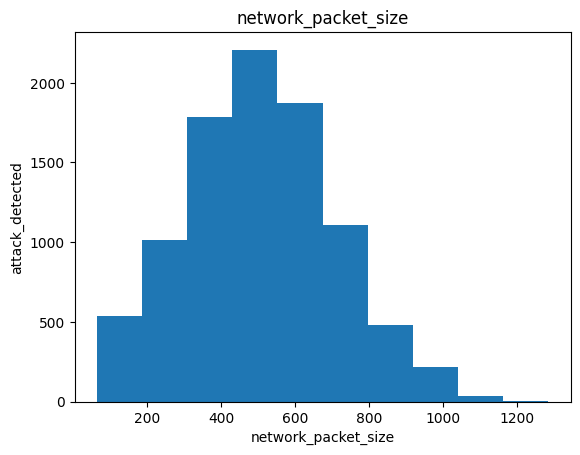

In [ ]:
plt.hist(data["network_packet_size"])

# set x/y labels and plot title
plt.xlabel("network_packet_size")
plt.ylabel("attack_detected")
plt.title("network_packet_size")

Text(0.5, 1.0, 'login_attempts')

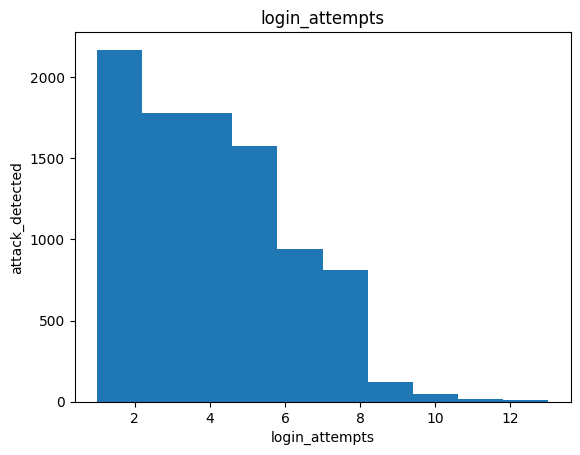

In [ ]:
plt.hist(data["login_attempts"])

# set x/y labels and plot title
plt.xlabel("login_attempts")
plt.ylabel("attack_detected")
plt.title("login_attempts")

#Logistic Regression

### Define features and target
Separating the data into features (X) and the target variable (y), which is 'attack_detected'.


In [ ]:
pip install dmba

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 70.2 MB/s eta 0:00:00


In [ ]:
import dmba

Colab environment detected.


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from dmba import classificationSummary


### Splitting the data into training and testing sets for model training and evaluation..


In [ ]:
X = data.drop('attack_detected', axis=1)
y = data['attack_detected']

In [ ]:
from sklearn.model_selection import train_test_split

train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.2, random_state=1)

### Training a logistic regression model on the training data.


In [ ]:
from sklearn.linear_model import LogisticRegression
logit_reg = LogisticRegression()
logit_reg.fit(train_X, train_y)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

### Performance evaluation of the trained model on the testing data.


**Reasoning**:
Import necessary metrics functions and evaluate the model on the test set.



In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print('intercept ', logit_reg.intercept_[0])
print(pd.DataFrame({'coeff': logit_reg.coef_[0]}, index=X.columns).transpose())

intercept  -1.4966295082733574
       network_packet_size  login_attempts  session_duration  \
coeff            -0.000096        0.361608          0.000089   

       ip_reputation_score  failed_logins  unusual_time_access  \
coeff             0.000349       0.889222            -0.114566   

       protocol_type_ICMP  protocol_type_TCP  protocol_type_UDP  \
coeff           -0.297642          -0.541686          -0.653638   

       encryption_used_AES  encryption_used_DES  encryption_used_nan  \
coeff            -0.547086            -0.513272            -0.432608   

       browser_type_  browser_type_Chrome  browser_type_Edge  \
coeff       0.435041            -0.635262          -0.514988   

       browser_type_Firefox  browser_type_Safari  
coeff             -0.537769            -0.239989  


In [ ]:
classificationSummary(train_y, logit_reg.predict(train_X))

Confusion Matrix (Accuracy 0.7213)

       Prediction
Actual    0    1
     0 3269  842
     1 1221 2070


In [ ]:
classificationSummary(test_y, logit_reg.predict(test_X))

Confusion Matrix (Accuracy 0.7256)

       Prediction
Actual   0   1
     0 804 195
     1 313 539


In [ ]:
from sklearn.metrics import classification_report

print("Training set metrics:")
print(classification_report(train_y, logit_reg.predict(train_X)))

print("Testing set metrics:")
print(classification_report(test_y, logit_reg.predict(test_X)))

Training set metrics:
              precision    recall  f1-score   support

           0       0.73      0.80      0.76      4111
           1       0.71      0.63      0.67      3291

    accuracy                           0.72      7402
   macro avg       0.72      0.71      0.71      7402
weighted avg       0.72      0.72      0.72      7402

Testing set metrics:
              precision    recall  f1-score   support

           0       0.72      0.80      0.76       999
           1       0.73      0.63      0.68       852

    accuracy                           0.73      1851
   macro avg       0.73      0.72      0.72      1851
weighted avg       0.73      0.73      0.72      1851



## Decision Tree

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier #if your dependent variable is binary
from sklearn.tree import DecisionTreeRegressor # if your dependent variable is numerical
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import dmba
from dmba import plotDecisionTree, classificationSummary, regressionSummary

In [ ]:
classTree = DecisionTreeClassifier(random_state=0)
classTree.fit(data.drop(columns=['attack_detected']), data['attack_detected'])

DecisionTreeClassifier(random_state=0)

In [ ]:
plotDecisionTree(classTree, feature_names=X.columns, class_names=classTree.classes_)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.732813 to fit


In [ ]:
classTree = DecisionTreeClassifier(random_state=0, max_depth=3)
classTree.fit(data.drop(columns=['attack_detected']), data['attack_detected'])

DecisionTreeClassifier(max_depth=3, random_state=0)

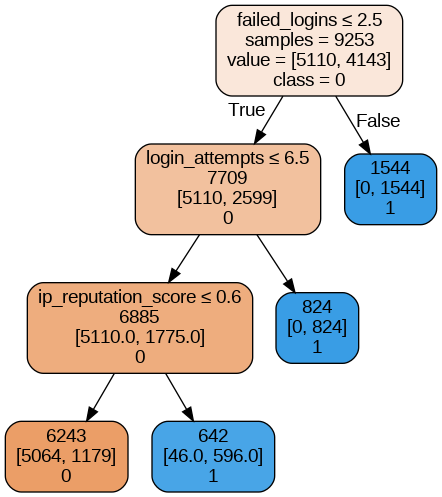

In [ ]:
plotDecisionTree(classTree, feature_names=X.columns, class_names=classTree.classes_)

In [ ]:
# Make predictions on the test set using the trained decision tree model
tree_predictions = classTree.predict(test_X)

# Display the classification summary
classificationSummary(test_y, tree_predictions)

Confusion Matrix (Accuracy 0.8595)

       Prediction
Actual   0   1
     0 988  11
     1 249 603


## KNN

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from dmba import classificationSummary

In [ ]:
# Initialize the StandardScaler
scaler = StandardScaler()

In [ ]:
# Scale training set
X_train_scaled = scaler.fit_transform(train_X)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=train_X.columns)

In [ ]:
# Scale test set
X_test_scaled = scaler.transform(test_X)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=test_X.columns)

In [ ]:
from sklearn.metrics import accuracy_score

# Train a classifier for different values of k
results = []
for k in range(1, 15):
    knn = KNeighborsClassifier(n_neighbors=k).fit(X_train_scaled, train_y)
    results.append({
        'k': k,
        'accuracy': accuracy_score(test_y, knn.predict(X_test_scaled))
    })

# Convert results to a pandas data frame
results = pd.DataFrame(results)
print(results)

     k  accuracy
0    1  0.695300
1    2  0.725014
2    3  0.723933
3    4  0.738520
4    5  0.736359
5    6  0.740140
6    7  0.739060
7    8  0.742842
8    9  0.748244
9   10  0.746623
10  11  0.753106
11  12  0.754187
12  13  0.755808
13  14  0.743922


In [ ]:
knn = KNeighborsClassifier(n_neighbors=13)

In [ ]:
knn.fit(X_train_scaled, train_y)

KNeighborsClassifier(n_neighbors=13)

In [ ]:
classificationSummary(test_y, knn.predict(X_test_scaled))

Confusion Matrix (Accuracy 0.7558)

       Prediction
Actual   0   1
     0 920  79
     1 373 479
